# Cleaned cross-chain master vault CCTP backtest excluding whitelist-gated vaults

Based on `20-backtest-ignore-missing-fee-vaults-cleaned.ipynb`.

NB21 retains NB20's native-USDC CCTP routing, 12% per-vault concentration cap, 5% cash allocation, fee-adjusted 90-day CAGR ranking and phase-aware queue venue. Vaults with incomplete fee metadata and vaults whose published `deposit_permission` is `whitelisted` remain in the universe solely for diagnostics; neither can receive a new allocation. The trading-universe chart separately shows allow-list-gated vaults, and the diagnostics table links every such vault to Trading Strategy.

## Key new insights

- The current 129-vault universe contains 14 vaults that require depositor allow-list approval. They are now explicitly marked as data-only pairs and excluded from allocation.
- The availability chart exposes their count independently, avoiding the misleading impression that every visible vault is investable.

## Summary of results

- The 2025-04-01 to 2026-03-11 backtest completed with final equity of 112,503.91 USD from 100,000 USD, a 12.50% total return across 3,235 trades.
- This is a safety and diagnostics variant. Its result must not be compared directly with NB20's saved output because NB21 used the subsequently refreshed vault dataset and metadata snapshot.

## Robustness of results

- NB21 asserts that every metadata-marked whitelist-gated vault has an ignore reason, and the alpha model excludes all ignored pairs before ranking.
- The universe, chart and linked diagnostics table were executed end-to-end against the current remote vault metadata. Whitelist classifications remain snapshot-dependent and should be refreshed before live deployment.


## Notebook setup

Imports, Trading Strategy client and charting setup.


In [1]:
import datetime
import logging
import os

import numpy as np
import pandas as pd
import plotly.express as px
from IPython.display import display
from dotenv import load_dotenv
from eth_defi.token import USDC_NATIVE_TOKEN
from plotly.graph_objects import Figure
from tradingstrategy.chain import ChainId
from tradingstrategy.client import Client
from tradingstrategy.timebucket import TimeBucket
from tradingstrategy.utils.token_filter import filter_for_selected_pairs

from tradeexecutor.analysis.vault import (
    WHITELISTED_VAULT_DIAGNOSTIC_FLAG,
    mark_whitelisted_vaults_ignored,
    render_whitelisted_vaults,
)
from tradeexecutor.backtest.backtest_runner import run_backtest_inline
from tradeexecutor.curator import is_quarantined
from tradeexecutor.ethereum.vault.checks import check_stale_vault_data
from tradeexecutor.exchange_account.allocation import (
    calculate_portfolio_target_value,
    get_redeemable_portfolio_capital,
)
from tradeexecutor.state.identifier import TradingPairIdentifier
from tradeexecutor.state.trade import TradeExecution
from tradeexecutor.state.types import USDollarAmount
from tradeexecutor.strategy.alpha_model import AlphaModel
from tradeexecutor.strategy.chart.definition import ChartInput, ChartKind, ChartRegistry
from tradeexecutor.strategy.chart.standard.alpha_model import (
    alpha_model_diagnostics,
    missed_vault_deposit_redemption_events,
    missed_vault_deposit_redemption_timeline,
)
from tradeexecutor.strategy.chart.standard.equity_curve import (
    equity_curve as equity_curve_chart,
    equity_curve_with_drawdown,
)
from tradeexecutor.strategy.chart.standard.interest import vault_statistics
from tradeexecutor.strategy.chart.standard.performance_metrics import performance_metrics
from tradeexecutor.strategy.chart.standard.position import positions_at_end
from tradeexecutor.strategy.chart.standard.profit_breakdown import trading_pair_breakdown
from tradeexecutor.strategy.chart.standard.thinking import last_messages
from tradeexecutor.strategy.chart.standard.trading_metrics import trading_metrics
from tradeexecutor.strategy.chart.standard.trading_universe import (
    available_trading_pairs,
    ignored_vault_data,
    inclusion_criteria_check,
)
from tradeexecutor.strategy.chart.standard.vault import (
    all_vault_positions,
    pending_trigger_queue,
    pending_vault_settlements,
    phase_aware_queue_duration,
    phase_aware_queue_duration_summary,
)
from tradeexecutor.strategy.chart.standard.weight import (
    equity_curve_by_asset,
    equity_curve_by_asset_with_legend,
    equity_curve_by_chain,
    weight_allocation_statistics,
)
from tradeexecutor.strategy.cycle import CycleDuration
from tradeexecutor.strategy.default_routing_options import TradeRouting
from tradeexecutor.strategy.execution_context import ExecutionContext, ExecutionMode, notebook_execution_context
from tradeexecutor.strategy.pandas_trader.indicator import (
    IndicatorDependencyResolver,
    IndicatorSource,
    calculate_and_load_indicators_inline,
)
from tradeexecutor.strategy.pandas_trader.indicator_decorator import IndicatorRegistry
from tradeexecutor.strategy.pandas_trader.strategy_input import StrategyInput
from tradeexecutor.strategy.pandas_trader.trading_universe_input import CreateTradingUniverseInput
from tradeexecutor.strategy.parameters import StrategyParameters
from tradeexecutor.strategy.reserve_currency import ReserveCurrency
from tradeexecutor.strategy.tag import StrategyTag
from tradeexecutor.strategy.trading_strategy_universe import (
    TradingStrategyUniverse,
    load_partial_data,
    load_vault_universe_with_metadata,
)
from tradeexecutor.strategy.chart.renderer import ChartBacktestRenderingSetup
from tradeexecutor.strategy.vault_fee_data import mark_missing_fee_vaults_ignored
from tradeexecutor.strategy.tvl_size_risk import USDTVLSizeRiskModel
from tradeexecutor.strategy.universe_model import UniverseOptions
from tradeexecutor.strategy.weighting import weight_passthrouh
from tradeexecutor.utils.dedent import dedent_any
from tradeexecutor.utils.notebook import OutputMode, display_head_and_tail, setup_charting_and_output
from tradeexecutor.visual.equity_curve import calculate_equity_curve, calculate_returns

from tradeexecutor.backtest.vault_windows import VaultWindowSchedule
from tradeexecutor.strategy.pandas_trader.yield_manager import (
    YieldDecisionInput,
    YieldManager,
    YieldRuleset,
    YieldWeightingRule,
)
from tradeexecutor.strategy.phase_aware import PhaseAwareAlphaModel, queue_vault_pair_ids

load_dotenv(override=True)
setup_charting_and_output(OutputMode.static, image_format="png", width=1500, height=900)

api_key = os.environ.get("TRADING_STRATEGY_API_KEY")
client = Client.create_jupyter_client(api_key=api_key)
logger = logging.getLogger("strategy")

trading_strategy_engine_version = "0.5"

Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/moo/.tradingstrategy


## Parameters

Strategy parameters and the phase-aware queue venue configuration.


In [2]:
class Parameters:
    id = "xchain-master-vault-exclude-whitelisted-vaults"
    candle_time_bucket = TimeBucket.d1
    cycle_duration = CycleDuration.cycle_1d
    chain_id = ChainId.cross_chain
    primary_chain_id = ChainId.ethereum
    preferred_stablecoin = USDC_NATIVE_TOKEN[ChainId.ethereum].lower()
    auto_generate_cctp_bridges = True

    data_history_start = datetime.datetime(2024, 6, 1)
    backtest_start = datetime.datetime(2025, 4, 1)
    backtest_end = datetime.datetime(2026, 3, 11)
    initial_cash = 100_000

    max_assets_in_portfolio = 20
    allocation_pct = 0.95
    cross_chain_cash_buffer_usd = 1_000
    rebalance_execution_cash_buffer_usd = 1.0
    max_concentration_pct = 0.12
    per_position_cap_of_pool_pct = 0.2
    min_portfolio_weight_pct = 0.005

    # Phase-aware queue venue (YieldManager) settings.
    # position_allocation is tied to allocation_pct (invariant 5): the 5% reserve is kept as
    # cash, the idle excess above it is swept into the queue venue to earn yield.
    use_managed_yield = True
    directional_trade_yield_buffer_pct = 0.02
    yield_flow_dust_threshold = 5.0

    absolute_min_vault_deposit_usd = 5.0
    individual_rebalance_min_threshold_usd = 50.0
    sell_rebalance_min_threshold_usd = 10.0

    min_tvl_usd = 50_000
    min_age = 0.0
    weight_signal = "3m_cagr_capped_waterfall"
    score_lookback_days = 90
    age_ramp_period = 0.75

    required_history_period = backtest_start - data_history_start
    routing = TradeRouting.default
    slippage_tolerance_pct = 0.0060
    assummed_liquidity_when_data_missings_usd = 0.01


parameters = StrategyParameters.from_class(Parameters)


# --- Phase-aware queue venue + window-gated vault configuration ---------------

# Hub-chain (Ethereum == primary_chain_id) deep *synchronous* USDC vault used as the yield-bearing
# "queue venue". It must be sync (instant liquidity) and on the primary chain, so a same-cycle
# venue release can fund a satellite-chain deposit via CCTP. Steakhouse USDC (Morpho) on Ethereum.
QUEUE_VENUE_ADDRESS = "0xbeef01735c132ada46aa9aa4c54623caa92a64cb"

# Window-gated directional vaults whose deposit/redemption windows we model as closed most of the
# time (D2 HYPE++). It is force-signalled to a top score so it deterministically earns
# a positive target and thus exercises the park -> deposit-on-open path.
WINDOW_GATED_VAULTS = [
    (ChainId.arbitrum, "0x75288264fdfea8ce68e6d852696ab1ce2f3e5004"),  # HYPE++ (d2-finance), Arbitrum
]

# Signal score (0..1 rank space) forced onto the window-gated vaults so they survive
# select_top_signals + the capped waterfall and always receive a positive target.
WINDOW_GATED_SIGNAL_SCORE = 0.999

# Synthetic deposit/redemption window: open a short spell at the start of every epoch. Frequent
# windows keep the park -> promote demonstration deterministic even for short-history vaults.
WINDOW_CADENCE = datetime.timedelta(days=14)
WINDOW_OPEN_DURATION = datetime.timedelta(days=2)
# Anchor so backtest_start falls in the CLOSED part of the first epoch (phase == open_duration is
# closed): this forces the window-gated vaults to defer (park) their first deposit and then promote
# when the window next opens, exercising the full park -> deposit-on-open path rather than depositing
# directly on an open start.
WINDOW_ANCHOR = Parameters.backtest_start - WINDOW_OPEN_DURATION


def get_window_gated_pairs(strategy_universe):
    """Resolve the window-gated vault pairs that are present in the universe."""
    pairs = []
    for _chain_id, address in WINDOW_GATED_VAULTS:
        try:
            pair = strategy_universe.get_pair_by_smart_contract(address)
        except Exception:
            pair = None
        if pair is not None:
            pairs.append(pair)
    return pairs


def create_yield_rules(parameters, strategy_universe) -> YieldRuleset:
    """Single-venue YieldRuleset: sweep idle cash into the hub-chain synchronous USDC vault.

    The last (only) slot has max_concentration == 1.0, the instant-liquidity fallback that absorbs
    all swept cash (YieldRuleset.validate() enforces this).
    """
    venue = strategy_universe.get_pair_by_smart_contract(QUEUE_VENUE_ADDRESS)
    assert venue is not None, f"Queue venue {QUEUE_VENUE_ADDRESS} not found in universe"
    return YieldRuleset(
        position_allocation=parameters.allocation_pct,
        buffer_pct=parameters.directional_trade_yield_buffer_pct,
        cash_change_tolerance_usd=parameters.yield_flow_dust_threshold,
        weights=[YieldWeightingRule(pair=venue, max_concentration=1.0)],
    )


def build_vault_window_overrides(strategy_universe) -> dict:
    """Map window-gated vault internal ids to a synthetic VaultWindowSchedule.

    Passed on the universe as ``vault_window_overrides``; BacktestPricing consults it BEFORE the
    real vault_state, so a stale / always-open availability frame cannot stop the schedule firing.
    """
    schedule = VaultWindowSchedule(
        cadence=WINDOW_CADENCE,
        open_duration=WINDOW_OPEN_DURATION,
        anchor=WINDOW_ANCHOR,
    )
    return {pair.internal_id: schedule for pair in get_window_gated_pairs(strategy_universe)}


## Universe definition

Native-USDC protocol subset on Ethereum, Base, Arbitrum, Avalanche, HyperEVM, and Monad, with synthetic CCTP bridge pairs for non-primary chains. Directional candidates include Arbitrum D2 HYPE++ only, Gains Network, Ember, Lagoon Finance vaults with current TVL above 50,000 USD, and IPOR Fusion vaults with current TVL above 50,000 USD. The universe includes depositable native-USDC Yearn, 40acres, cSigma Finance, YieldNest, Plutus, Hyperithm, Sky, and Sentora vaults available on supported CCTP routes. The Midas Hyperithm vault is excluded because its known 0.5% withdrawal fee is unsupported. Every explicit `subvault` record and every legacy Yearn `Compounder` suffix is excluded. Vaults whose metadata says `deposit_permission="whitelisted"` remain data-only diagnostics and cannot receive allocations.


In [3]:
LENDING_RESERVES = None

SUPPORTING_PAIRS = [
    (ChainId.ethereum, "uniswap-v3", "WETH", "USDC", 0.0005),
    (ChainId.ethereum, "uniswap-v3", "WBTC", "USDC", 0.003),
    (ChainId.arbitrum, "uniswap-v3", "WETH", "USDC", 0.0005),
    (ChainId.base, "uniswap-v3", "WETH", "USDC", 0.0005),
]

BENCHMARK_PAIRS = SUPPORTING_PAIRS

SOURCE_VAULTS = [
    # Native-USDC source universe generated from Trading Strategy vault metadata (2026-07-19).
    # Retained protocols: Arbitrum HYPE++ only, Gains Network, Ember, Lagoon Finance, and IPOR Fusion.
    # Expanded protocols: all depositable native-USDC Yearn, 40acres, cSigma Finance, YieldNest, Plutus, and curated vaults except Midas Hyperithm (0.5% withdrawal fee).
    # Explicit subvault metadata and the legacy Yearn Compounder suffix are always excluded.
    # The Ethereum Steakhouse USDC vault is retained exclusively as the phase-aware queue venue.
    # Chains: Ethereum, Base, Arbitrum, Avalanche, HyperEVM, Monad.
    # Selected native-USDC source vaults including queue venue: 129.
    # cSigma USD (csigma-finance, current TVL=$56,205, risk=Severe, flags=none, reason=all native-USDC csigma-finance)
    (ChainId.ethereum, "0xd5d097f278a735d0a3c609deee71234cac14b47e"),
    # cSuperior Quality Private Credit USDC (csigma-finance, current TVL=$422,923, risk=Severe, flags=none, reason=all native-USDC csigma-finance)
    (ChainId.ethereum, "0x438982ea288763370946625fd76c2508ee1fb229"),
    # Ember Apollo ACRED (ember, current TVL=$55,763, risk=Low, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x2b13311fd553e74b421d4ccc96e348f71e179dcf"),
    # Ember Earn (ember, current TVL=$3,283,688, risk=Low, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x9be9294722f8aad37b11a9792be2c782182cafa2"),
    # Ember Polymarket (ember, current TVL=$45,053, risk=Low, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x0b9342c15143e8f54a83f887c280a922f4c48771"),
    # Ember Third Eye (ember, current TVL=$161,428, risk=Low, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xf3190a3ecc109f88e7947b849b281918c798a0c4"),
    # Ember UDL (ember, current TVL=$51,609, risk=Low, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x373152feef81cc59502da2c8de877b3d5ae2e342"),
    # BL USDC WSR Loop  (ipor-fusion, current TVL=$57,387, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x95b2ed8f821570f85fd0e3e6e7088c6296587088"),
    # Bitcoin Dollar USDC (ipor-fusion, current TVL=$562,927, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xf8f226da66244f89e70c5b5d1a5c5b0d505eb1d8"),
    # Hyperithm mHYPER Looping (ipor-fusion, current TVL=$127,637, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x0b45a1e71a8a09f5d382fed27202d50ed983aaf3"),
    # IPOR USDC Ethereum Optimizer (ipor-fusion, current TVL=$465,487, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x43ee0243ea8cf02f7087d8b16c8d2007cc9c7ca2"),
    # TAU InfiniFi Pointsmax (ipor-fusion, current TVL=$845,226, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xb0f56bb0bf13ee05fef8cd2d8df5ffdfcac7a74f"),
    # TAU Lending Optimizer (ipor-fusion, current TVL=$280,497, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x63103375659d0aa94e9f35df15be01a3dd1ae9c0"),
    # TAU Yield Bond ETF (ipor-fusion, current TVL=$259,953, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x43a32d4f6c582f281c52393f8f9e5ace1d4a1e68"),
    # TESS USDC Ethena Loop Vault (ipor-fusion, current TVL=$518,165, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x888e1d3c509c80e24cab8a4872e164b7e5a6eb10"),
    # TESS USDC Lending Optimiser (ipor-fusion, current TVL=$3,169,143, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xc825779c89120eeef746c51130b362478e181d39"),
    # TESS USDC wsrUSD Loop (ipor-fusion, current TVL=$478,210, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x4c5a611694c426cae9335d53e95b885090cf8c31"),
    # TESS sUSDe PYUSD (USDC) Loop Vault (ipor-fusion, current TVL=$420,734, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x32f07401eb177f2c0fc4f95f3928050d88dae7ed"),
    # Tesseract USDC Lending Optimizer (ipor-fusion, current TVL=$845,499, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xc2a119ea6de75e4b1451330321cb2474eb8d82d4"),
    # 1212.Stable (lagoon-finance, current TVL=$1,695,085, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xbb30c3b6046debcbe941281218d18dec8ecebeb5"),
    # AltaETF (lagoon-finance, current TVL=$134,455, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0x3be67ba2d3fec744d1d2b5d564c83f57372578e4"),
    # Ammalgam USDC Vault (lagoon-finance, current TVL=$131,122, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x8417430a31851ae0a36a854394227c5d86be8fc9"),
    # Autonomous Liquidity USD (lagoon-finance, current TVL=$460,738, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xdcd0f5ab30856f28385f641580bbd85f88349124"),
    # Block4Block (lagoon-finance, current TVL=$252,912, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0x9fdbaaa76194d56e49cade12c1f216f47d2b865e"),
    # Coinshift Conservative USPC (lagoon-finance, current TVL=$6,902,716, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xfab0f56c28e3f874b15922b213e696f37b670916"),
    # DeTrade Morpho X-Chain USDC (lagoon-finance, current TVL=$111,922, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x7d2c2f54792ad72cb834d298f542145b06b703cb"),
    # Der USDC (lagoon-finance, current TVL=$2,585,506, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0xf10801bcc3deaf467fb8b3dbb7430111822e6dab"),
    # Der base USDC (lagoon-finance, current TVL=$4,914,858, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0xba6cfe8a9d199cd7f3e50114c4e4ec66f2d52c87"),
    # FLEXIBLE CRYPTO FUND (lagoon-finance, current TVL=$53,770, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0x06973fbca7c589d10dfbe45d694dce634bff6165"),
    # Gami Capital lvlUSD (lagoon-finance, current TVL=$129,671, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0x59b7942f7d2afd085691ce65c152e0d38d4eff22"),
    # Gami USDC (lagoon-finance, current TVL=$6,530,557, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xdae854d0896ad2fee335689a3f7b4a95fd1a3e46"),
    # Hub Capital USDC vault (lagoon-finance, current TVL=$990,867, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xca790385506b790554571cbc9da73f0130cdcfd5"),
    # Moon Digital AM USDC (lagoon-finance, current TVL=$932,398, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xa00f63e85b3d242568a9edecb48f5e2cf879b07b"),
    # Mt Pelerin x Montaigne - Strategy pool (lagoon-finance, current TVL=$520,383, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0x14b8de97d078cabf38ba3d0b7e067618f0e8ab7d"),
    # Mt Pelerin – USD strategy pool (lagoon-finance, current TVL=$828,059, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x28663161f9fa2963eb6102b88a741e195e974df6"),
    # Muchacho USDC (lagoon-finance, current TVL=$1,030,092, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0xef39d77c7fb6224ac974c5fa4e3151a6c6ce9594"),
    # Noon STS USDC (lagoon-finance, current TVL=$199,999, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0xb993c32f578e5156369330787cf8c8fe033bf40e"),
    # Strada USDC (lagoon-finance, current TVL=$315,248, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0xcb58582b0d52ce5feecb06ba9ce66598b0d57886"),
    # Syntropia <> Resupply (lagoon-finance, current TVL=$128,093, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0xa96bc6e084aad6976d25df9431525ed2c4d3cae4"),
    # Syntropia Boosted (lagoon-finance, current TVL=$350,203, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x8df3deba711ae4a9af16cbca5e4fbb1402f036d5"),
    # Syntropia USDC (lagoon-finance, current TVL=$3,183,375, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xd17049ed25d8f99fe3bfd10cef2263da9995cfd8"),
    # Syntropia USDC Core (lagoon-finance, current TVL=$1,085,101, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0x1b2cb79a4564206f53ba80b4d780f251b4ae6765"),
    # Tulipa USDC (lagoon-finance, current TVL=$9,054,689, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xce0b790ae0d8cf91e01f3fb69025e14569b574f3"),
    # Zharta RWA Prime USDC (lagoon-finance, current TVL=$362,405, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.ethereum, "0xb4a4c9a736f91e2694c6b921445eef3e3585a591"),
    # pyUSDC (lagoon-finance, current TVL=$784,281, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.ethereum, "0x175ea882b492c9b7a6d5852fe9da560dc7af1c72"),
    # Steakhouse USDC (morpho, current TVL=$95,270,152, risk=Negligible, flags=none, reason=phase-aware queue venue infrastructure)
    (ChainId.ethereum, "0xbeef01735c132ada46aa9aa4c54623caa92a64cb"),
    # Arche USD (yearn, current TVL=$10,537, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x33ffc177a7278ff84aab314a036bc7b799b7cc15"),
    # Katana Pre-Deposit USDC (yearn, current TVL=$70,387,004, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x7b5a0182e400b241b317e781a4e9dedfc1429822"),
    # Katana Pre-Deposit USDC (yearn, current TVL=$7,712,627, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0xf470eb50b4a60c9b069f7fd6032532b8f5cc014d"),
    # Katana Pre-DepositUSDC (yearn, current TVL=$105, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0xf20b02131c45b22e147c98e30cc889a20dc8a00d"),
    # Ondo aggregator (yearn, current TVL=$696, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0xaca399117ac588e1f48398d34eca76cdb1e45fa5"),
    # Silo-LRT USDC yVault (yearn, current TVL=$32, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x4dd0fe8549641a04d7ab4f37dbb541ae7dbb2838"),
    # StrategyGearboxLenderUSDC (yearn, current TVL=$240, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0xf6e2d36c489e5b361cdc962d4568cea663ad5ddc"),
    # Sturdy USDC-taoUSD bridge vault (yearn, current TVL=$3,378, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x46e9893422b9ae9246793489433f72c548cb2455"),
    # Teller USDC (yearn, current TVL=$68,657, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0xb73b7dc2d967473ad669e35186efee3335e30eb9"),
    # Test yvUSD (yearn, current TVL=$8, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0xc62fc9b0bb3d9c7a47a6af1ed30d7a4c74e37774"),
    # USD yVault (yearn, current TVL=$8,983,832, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x696d02db93291651ed510704c9b286841d506987"),
    # USD3 Pendle PT Maxi (yearn, current TVL=$51, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x4c0e4d3cb62b91afbbf1fe8e830f98a513c7234b"),
    # USD3 Pendle PT Maxi (yearn, current TVL=$400,216, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x62ebe2ca290db3b649c390847f8204196771b438"),
    # USDC Meta Vault (yearn, current TVL=$3,945,757, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x697c54a84d83f37380d034e2bfc6f7ce8d89f4ee"),
    # USDC-1 yVault (yearn, current TVL=$25,470,564, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0xbe53a109b494e5c9f97b9cd39fe969be68bf6204"),
    # USDC-2 yVault (yearn, current TVL=$1,186,012, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0xae7d8db82480e6d8e3873ecbf22cf17b3d8a7308"),
    # Usual aggregator (yearn, current TVL=$554, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x8670120c32de7bc990e0fe3bbd04704e98492f0a"),
    # Yeet It USD (yearn, current TVL=$311,000, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x7bb36e40a7b08f653ddc24e2e1181559f4d52f2a"),
    # sUSDS Pendle PT Maxi (yearn, current TVL=$573,966, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x2df6c1602528de8b8a5c72baf6e70295b3a64142"),
    # usdc-vault (yearn, current TVL=$13,395, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.ethereum, "0x9cfb40acedac259b1d23e790f6c6d0c3898361ad"),
    # YieldNest RWA MAX (yieldnest, current TVL=$9,260,482, risk=Low, flags=none, reason=all native-USDC yieldnest)
    (ChainId.ethereum, "0x01ba69727e2860b37bc1a2bd56999c1afb4c15d8"),
    # Aerodrome USDC (40acres, current TVL=$7,346,519, risk=Low, flags=none, reason=all native-USDC 40acres)
    (ChainId.base, "0xb99b6df96d4d5448cc0a5b3e0ef7896df9507cf5"),
    # gTrade (Gains Network USDC) (gains-network, current TVL=$838,694, risk=Unknown, flags=none, reason=retained baseline)
    (ChainId.base, "0xad20523a7dc37babc1cc74897e4977232b3d02e5"),
    # Autopilot USDC Base (ipor-fusion, current TVL=$948,929, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.base, "0x0d877dc7c8fa3ad980dfdb18b48ec9f8768359c4"),
    # Autopilot USDC Morpho (Base) (ipor-fusion, current TVL=$93,832, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.base, "0xd6701905c59ee618dc36dc747506bce0a4ac760a"),
    # IPOR USDC Lending Optimizer Base (ipor-fusion, current TVL=$175,795, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.base, "0x45aa96f0b3188d47a1dafdbefce1db6b37f58216"),
    # yoUSD Looopeer (ipor-fusion, current TVL=$814,311, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.base, "0x1166250d1d6b5a1dbb73526257f6bb2bbe235295"),
    # 722Capital-USDC (lagoon-finance, current TVL=$52,076, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.base, "0xb09f761cb13baca8ec087ac476647361b6314f98"),
    # DeTrade Core USDC (lagoon-finance, current TVL=$631,879, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.base, "0x8092ca384d44260ea4feaf7457b629b8dc6f88f0"),
    # For Yield v2 (lagoon-finance, current TVL=$130,000, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.base, "0x2bff679b1a9fbcc202316c1402172747ba2fbf56"),
    # GUSDC (lagoon-finance, current TVL=$268,575, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.base, "0xd5c22fa3f7ee979ed7c28e36669b29797ab277e4"),
    # MSA - Portefeuille Dynamique  (lagoon-finance, current TVL=$147,442, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.base, "0xf56bfe07b8d6e6d74258cdb6969a633629b06b08"),
    # MoneyFi FlowForge Vault (lagoon-finance, current TVL=$73,041, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.base, "0x4efc07dca8697792119484af33549f33ab11bf3c"),
    # RB Capital Yield (lagoon-finance, current TVL=$156,350, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.base, "0x63b04d3ce2c14f6d308657ab73ac92fc1a0b1075"),
    # TruMarket (lagoon-finance, current TVL=$218,045, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.base, "0xbe7db44f4ce20dac83b578b94fd35087f66e9754"),
    # Azur USDC (yearn, current TVL=$5,329, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0x94d886d25729150adfa20210f9b94cefe0b3d132"),
    # Chimi USDC Vault (yearn, current TVL=$238,390, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0xcb2f26898c0893c0bdd5cf76417cf9b2258af0ed"),
    # Chimi USDC Vault Turbo (yearn, current TVL=$107,191, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0x0c352ab624313ae28ed4073dc5d469eb36e164c6"),
    # MUV002 - Flagship USDC (yearn, current TVL=$4, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0x50fd1e6e0e2153c2b26ebbcd9bcded4639a1aae3"),
    # Moonwell USDC Lender WETH Borrower (yearn, current TVL=$2,015, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0xfdb431e661372fa1146efb70bf120ecded944a78"),
    # Moonwell USDC Lender cbBTC Borrower (yearn, current TVL=$182, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0x945df73d55557ea23c0c35cd350d8de3b745287e"),
    # RizVaultUSDC (yearn, current TVL=$187, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0x7bb8b0b176199b3313642dde3421e38e548d6570"),
    # Teller USDC (yearn, current TVL=$101,213, risk=Blacklisted, flags=unofficial, reason=all native-USDC yearn)
    (ChainId.base, "0x19f233b2953275196e6343f17b76da098c478e21"),
    # True Yield Dollar (yearn, current TVL=$700,664, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0xb13cf163d916917d9cd6e836905ca5f12a1def4b"),
    # USDC BaseInvaders (yearn, current TVL=$10,897, risk=Blacklisted, flags=abnormal_tvl, reason=all native-USDC yearn)
    (ChainId.base, "0xd1468af648565f11393e4033cb0cd270b62495c9"),
    # USDC Horizon yVault (yearn, current TVL=$980,753, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0xc3bd0a2193c8f027b82dde3611d18589ef3f62a9"),
    # Yeet It USD (yearn, current TVL=$101,000, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.base, "0x92a6f4cc1e26baa1beec168e3c346aedcb437f31"),
    # HYPE++ (d2-finance, current TVL=$11,691,130, risk=High, flags=none, reason=retained baseline)
    (ChainId.arbitrum, "0x75288264fdfea8ce68e6d852696ab1ce2f3e5004"),
    # gTrade (Gains Network USDC) (gains-network, current TVL=$6,751,639, risk=Unknown, flags=none, reason=retained baseline)
    (ChainId.arbitrum, "0xd3443ee1e91af28e5fb858fbd0d72a63ba8046e0"),
    # IPOR USDC Prime (ipor-fusion, current TVL=$235,482, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.arbitrum, "0xd855296f9868ff659f3f359c90b7d005ec049228"),
    # Angmar Capital (lagoon-finance, current TVL=$2,651,813, risk=Blacklisted, flags=unofficial, reason=retained baseline)
    (ChainId.arbitrum, "0x1723cb57af58efb35a013870c90fcc3d60174a4e"),
    # Sandbox (lagoon-finance, current TVL=$431,482, risk=Minimal, flags=none, reason=retained baseline)
    (ChainId.arbitrum, "0x018282d5b510f00dcacb8f4a81c3901d2fc9da51"),
    # Plutus Dolomite vault (plutus, current TVL=$1, risk=Severe, flags=none, reason=all native-USDC plutus)
    (ChainId.arbitrum, "0xf84eaa0685626f84fe17bc6c3c9eb2ac8a90d3c1"),
    # Plutus Hedge Token (plutus, current TVL=$241,948, risk=Severe, flags=none, reason=all native-USDC plutus)
    (ChainId.arbitrum, "0x58bfc95a864e18e8f3041d2fcd3418f48393fe6a"),
    # MUV001 - Flagship USDC (yearn, current TVL=$32, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.arbitrum, "0xe6dbfb035b44e94d07f7b3e4f6bfbf1c6e68e3d0"),
    # RizVaultUSDC (yearn, current TVL=$50,607, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.arbitrum, "0x2e7aa06a0f0816de4b1a32a12b0ac4eb584bff2a"),
    # Teller USDC (yearn, current TVL=$50,691, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.arbitrum, "0xbe7d1b3cf19eb05ac557be14af24e093fadfd7c6"),
    # USDC-A yVault (yearn, current TVL=$23,802, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.arbitrum, "0x6faf8b7ffee3306efcfc2ba9fec912b4d49834c1"),
    # yPT-aUSDC (auto-rolling Pendle PT) (yearn, current TVL=$31, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.arbitrum, "0x2b0b6376083c6e1f376c7439f328436a673f333c"),
    # yPT-aUSDC (auto-rolling Pendle PT) (yearn, current TVL=$0, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.arbitrum, "0xdf9640332bcfd3b16cb80c1287ed04b875d9a384"),
    # Blackhole USDC (40acres, current TVL=$657,598, risk=Low, flags=none, reason=all native-USDC 40acres)
    (ChainId.avalanche, "0xc0485c4bafb594ae1457820fb6e5b67e8a04bcfd"),
    # Pharaoh USDC (40acres, current TVL=$515,859, risk=Low, flags=none, reason=all native-USDC 40acres)
    (ChainId.avalanche, "0x124d00b1ce4453ffc5a5f65ce83af13a7709bac7"),
    # ygamiUSDC (yearn, current TVL=$590,908, risk=Minimal, flags=none, reason=all native-USDC yearn)
    (ChainId.avalanche, "0x9fd32fd5e32c6b95483d36c5e724c5c5250ce010"),
    # ymevUSDC (yearn, current TVL=$750,117, risk=Blacklisted, flags=abnormal_price_on_low_tvl, reason=all native-USDC yearn)
    (ChainId.avalanche, "0x7aca67a6856bf532a7b2dea9b20253f08bc9a85a"),
    # Curated native-USDC additions: every Hyperithm vault compatible with this CCTP universe.
    # Hyperithm USDC Midcurve (morpho, curator=hyperithm)
    (ChainId.ethereum, "0x0229db3921de71cfa43cfe9fb6a87b403647a9ae"),
    # Apyx USDC (morpho, curator=hyperithm)
    (ChainId.ethereum, "0x069662d2588fcac24b5c209456db965d151556f0"),
    # Hyperithm USDC Degen (morpho, curator=hyperithm)
    (ChainId.ethereum, "0x093272c07700d3ca5301c3bf9b3a392624179e2f"),
    # Hyperithm Euler USDC (euler, curator=hyperithm)
    (ChainId.ethereum, "0x3cd3718f8f047aa32f775e2cb4245a164e1c99fb"),
    # Hyperithm USDC Degen (morpho, curator=hyperithm)
    (ChainId.ethereum, "0x777791c4d6dc2ce140d00d2828a7c93503c67777"),
    # Hyperithm mHYPER (euler, curator=hyperithm)
    (ChainId.ethereum, "0x8aff4fe319c30475d27ec623d7d44bd5ecfe9616"),
    # Saturn USDC (morpho, curator=hyperithm)
    (ChainId.ethereum, "0xabe418cc8c06d265e4eb009c02ea4b265eca7240"),
    # Morpho Hyperithm USDC Strategy (erc-4626, curator=hyperithm)
    (ChainId.ethereum, "0xba8704c18b55f60f5d84b53c3f39a0189a0965b3"),
    # Hyperithm USDC Midcurve (morpho, curator=hyperithm)
    (ChainId.ethereum, "0xcdaea3dde6ce5969aa1414a82a3a681ced51ce72"),
    # Hyperithm USDC Degen (morpho, curator=hyperithm)
    (ChainId.monad, "0x78999cc96d2ba0341588c60ccb0e91c6c33cf371"),
    # Hyperithm Delta Neutral Vault (accountable, curator=hyperithm)
    (ChainId.monad, "0x7cd231120a60f500887444a9baf5e1bd753a5e59"),
    # Hyperithm USDC Degen (morpho, curator=hyperithm)
    (ChainId.monad, "0xa8665084d8cd6276c00ca97cbc0bf4bc9ae94c79"),
    # Hyperithm USDC (morpho, curator=hyperithm)
    (ChainId.arbitrum, "0x4b6f1c9e5d470b97181786b26da0d0945a7cf027"),
    # Curated native-USDC additions: every Sky vault.
    # sky.money USDC Risk Capital (morpho, curator=sky)
    (ChainId.ethereum, "0x56bfa6f53669b836d1e0dfa5e99706b12c373ecf"),
    # USDC To SKY USDS Depositor (erc-4626, curator=sky)
    (ChainId.ethereum, "0x7130570bcefcedbe9d15b5b11a33006156460f8f"),
    # Curated native-USDC additions: every Sentora vault.
    # Morpho V2 Sentora PYUSD Convertor (erc-4626, curator=sentora)
    (ChainId.ethereum, "0x3d2467cbf82332dbfb38997cbc4d2192694d9490"),
    # Sentora RLUSD (euler, curator=sentora)
    (ChainId.ethereum, "0x9bd52f2805c6af014132874124686e7b248c2cbb"),
    # Sentora PYUSD (euler, curator=sentora)
    (ChainId.ethereum, "0xab2726daf820aa9270d14db9b18c8d187cbf2f30"),
    # Sentora USD Earn (upshift, curator=sentora)
    (ChainId.ethereum, "0x74ad2f789ed583dbd141bbdafc673fe1f033718b"),
]

In [4]:
def _get_available_supporting_pair_ids(strategy_universe):
    pair_ids = set()
    for desc in SUPPORTING_PAIRS:
        try:
            pair_ids.add(strategy_universe.get_pair_by_human_description(desc).internal_id)
        except KeyError:
            continue
    return pair_ids


def assert_no_entry_exit_fees(vault_universe) -> None:
    """Reject vaults whose explicit deposit or withdrawal fee is non-zero."""
    unsupported_vaults = []
    for vault in vault_universe.iterate_vaults():
        metadata = vault.get_metadata()
        deposit_fee = metadata.deposit_fee
        withdrawal_fee = metadata.withdrawal_fee
        if deposit_fee not in (None, 0, 0.0) or withdrawal_fee not in (None, 0, 0.0):
            unsupported_vaults.append(
                f"{vault.name} ({vault.chain_id.get_name()} {vault.vault_address}): "
                f"deposit={deposit_fee!r}, withdrawal={withdrawal_fee!r}"
            )

    assert not unsupported_vaults, (
        "We do not support vaults with entry/exit fees because the backtest does not "
        "model them:\n - " + "\n - ".join(unsupported_vaults)
    )


def create_trading_universe(input: CreateTradingUniverseInput) -> TradingStrategyUniverse:
    execution_context = input.execution_context
    client = input.client
    timestamp = input.timestamp
    params = input.parameters or Parameters
    universe_options = input.universe_options

    debug_printer = logger.info if execution_context.live_trading else print
    chain_id = params.primary_chain_id

    supporting_pairs = [] if execution_context.live_trading else SUPPORTING_PAIRS

    debug_printer(f"Preparing trading universe on chain {chain_id.get_name()}")

    all_pairs_df = client.fetch_pair_universe().to_pandas()
    pairs_df = filter_for_selected_pairs(all_pairs_df, supporting_pairs)
    debug_printer(f"We have total {len(all_pairs_df)} pairs in dataset and going to use {len(pairs_df)} pairs for the strategy")

    vault_universe = load_vault_universe_with_metadata(client, vaults=SOURCE_VAULTS)
    if params.auto_generate_cctp_bridges:
        vault_universe = vault_universe.limit_to_native_usdc()
    assert_no_entry_exit_fees(vault_universe)
    debug_printer(
        f"Loaded {vault_universe.get_vault_count()} vaults from remote vault metadata, "
        f"source vaults count: {len(SOURCE_VAULTS)}"
    )

    dataset = load_partial_data(
        client=client,
        time_bucket=params.candle_time_bucket,
        pairs=pairs_df,
        execution_context=execution_context,
        universe_options=universe_options,
        liquidity=True,
        liquidity_time_bucket=TimeBucket.d1,
        lending_reserves=LENDING_RESERVES,
        vaults=vault_universe,
        vault_history_source="trading-strategy-website",
        check_all_vaults_found=True,
    )

    strategy_universe = TradingStrategyUniverse.create_from_dataset(
        dataset,
        reserve_asset=params.preferred_stablecoin,
        forward_fill=True,
        forward_fill_until=timestamp,
        primary_chain=params.primary_chain_id,
        auto_generate_cctp_bridges=params.auto_generate_cctp_bridges,
    )

    ignored_pairs = mark_missing_fee_vaults_ignored(strategy_universe)
    debug_printer(
        f"Ignored {len(ignored_pairs)} vaults with missing fee data, "
        f"retained as data-only pairs (ignore_reason=lacks_fee_data)"
    )

    whitelisted_pairs = mark_whitelisted_vaults_ignored(strategy_universe)
    debug_printer(
        f"Marked {len(whitelisted_pairs)} whitelist-gated vaults as data-only pairs "
        f"for diagnostics (ignore_reason=requires_whitelist where no other reason applies)"
    )

    return strategy_universe

In [5]:
universe_input = CreateTradingUniverseInput(
    client=client,
    timestamp=None,
    parameters=parameters,
    execution_context=notebook_execution_context,
    execution_model=None,
    universe_options=UniverseOptions.from_strategy_parameters_class(Parameters, notebook_execution_context),
)
strategy_universe = create_trading_universe(universe_input)

# Attach the synthetic deposit/redemption window overrides for the window-gated vaults.
# BacktestPricing consults these before the real vault_state (override wins).
strategy_universe.vault_window_overrides = build_vault_window_overrides(strategy_universe)
print(f"Configured {len(strategy_universe.vault_window_overrides)} synthetic vault window overrides")

pairs = list(strategy_universe.iterate_pairs())
vault_pairs = [pair for pair in pairs if pair.kind.is_vault()]
bridge_pairs = [pair for pair in pairs if pair.kind.is_cctp_bridge()]
ignored_vault_pairs = [pair for pair in vault_pairs if pair.get_ignore_reason() is not None]
whitelisted_vault_pairs = [
    pair
    for pair in vault_pairs
    if pair.other_data.get(WHITELISTED_VAULT_DIAGNOSTIC_FLAG)
]

universe_summary = pd.DataFrame(
    [
        ("Chains", ", ".join(sorted(chain.get_name() for chain in strategy_universe.data_universe.chains))),
        ("Total pairs", len(pairs)),
        ("Vault pairs", len(vault_pairs)),
        ("Ignored vaults (data-only)", len(ignored_vault_pairs)),
        ("Whitelisted vaults (cannot allocate)", len(whitelisted_vault_pairs)),
        ("CCTP bridge pairs", len(bridge_pairs)),
        ("Vault denominations", ", ".join(sorted({pair.quote.token_symbol for pair in vault_pairs}))),
        ("Bridge destinations", ", ".join(str(pair.get_destination_chain_id()) for pair in bridge_pairs)),
    ],
    columns=["Metric", "Value"],
)

display(universe_summary)

expected_destination_chain_ids = {
    chain_id.value
    for chain_id, _address in SOURCE_VAULTS
    if chain_id != Parameters.primary_chain_id
}
observed_destination_chain_ids = {pair.get_destination_chain_id() for pair in bridge_pairs}

assert observed_destination_chain_ids == expected_destination_chain_ids, (
    f"Expected CCTP bridge pairs for {expected_destination_chain_ids}, got {observed_destination_chain_ids}"
)
assert {pair.quote.token_symbol for pair in vault_pairs} == {"USDC"}
assert all(pair.get_ignore_reason() is not None for pair in whitelisted_vault_pairs), (
    "Whitelist-gated vaults must be retained only as data-only diagnostic pairs"
)
for pair in vault_pairs:
    expected_addr = USDC_NATIVE_TOKEN.get(pair.chain_id)
    assert expected_addr is not None, f"No native USDC address for chain {pair.chain_id}"
    assert pair.quote.address.lower() == expected_addr.lower(), (
        f"{pair.get_ticker()} denomination {pair.quote.address} != native USDC {expected_addr}"
    )


Preparing trading universe on chain Ethereum


We have total 392255 pairs in dataset and going to use 4 pairs for the strategy


Loaded 129 vaults from remote vault metadata, source vaults count: 129


Loading TVL/liquidity data for 4 pairs:   0%|          | 0/4 [00:00<?, ?it/s]

Loading TVL/liquidity data for 4 pairs: 100%|██████████| 4/4 [00:00<00:00, 53.84it/s]

Ignored 0 vaults with missing fee data, retained as data-only pairs (ignore_reason=lacks_fee_data)
Marked 14 whitelist-gated vaults as data-only pairs for diagnostics (ignore_reason=requires_whitelist where no other reason applies)
Configured 1 synthetic vault window overrides


,Metric,Value
0,Chains,"Arbitrum One, Avalanche C-chain, Base, Ethereu..."
1,Total pairs,137
2,Vault pairs,129
3,Ignored vaults (data-only),14
4,Whitelisted vaults (cannot allocate),14
5,CCTP bridge pairs,4
6,Vault denominations,USDC
7,Bridge destinations,"143, 8453, 42161, 43114"


## Indicators

TVL, age and fee-adjusted 90-day CAGR indicators plus the inclusion criteria.


In [6]:
indicators = IndicatorRegistry()


@indicators.define(source=IndicatorSource.tvl)
def tvl(close: pd.Series) -> pd.Series:
    return close


@indicators.define()
def age(close: pd.Series) -> pd.Series:
    inception = close.index[0]
    age_years = (close.index - inception) / pd.Timedelta(days=365.25)
    return pd.Series(age_years, index=close.index)


@indicators.define(dependencies=(tvl,), source=IndicatorSource.dependencies_only_universe)
def tvl_inclusion_criteria(min_tvl_usd: USDollarAmount, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data_pairs_combined(tvl)
    mask = series >= min_tvl_usd
    mask_true_values_only = mask[mask]
    return mask_true_values_only.groupby(level="timestamp").apply(
        lambda x: x.index.get_level_values("pair_id").tolist()
    )


@indicators.define(dependencies=(age,), source=IndicatorSource.dependencies_only_universe)
def age_inclusion_criteria(min_age: float, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data_pairs_combined(age)
    mask = series >= min_age
    mask_true_values_only = mask[mask]
    return mask_true_values_only.groupby(level="timestamp").apply(
        lambda x: x.index.get_level_values("pair_id").tolist()
    )


@indicators.define(source=IndicatorSource.strategy_universe)
def trading_availability_criteria(strategy_universe: TradingStrategyUniverse) -> pd.Series:
    candle_series = strategy_universe.data_universe.candles.df["open"]
    return candle_series.groupby(level="timestamp").apply(
        lambda x: x.index.get_level_values("pair_id").tolist()
    )


@indicators.define(source=IndicatorSource.strategy_universe)
def whitelisted_vault_pair_count(strategy_universe: TradingStrategyUniverse) -> pd.Series:
    """Count visible whitelist-gated vaults retained only for diagnostics."""
    whitelisted_pair_ids = {
        pair.internal_id
        for pair in strategy_universe.iterate_pairs()
        if pair.other_data.get(WHITELISTED_VAULT_DIAGNOSTIC_FLAG)
    }
    candle_series = strategy_universe.data_universe.candles.df["open"]
    return candle_series.groupby(level="timestamp").apply(
        lambda x: len(set(x.index.get_level_values("pair_id")) & whitelisted_pair_ids)
    )


@indicators.define(
    dependencies=[tvl_inclusion_criteria, trading_availability_criteria, age_inclusion_criteria],
    source=IndicatorSource.strategy_universe,
)
def inclusion_criteria(
    strategy_universe: TradingStrategyUniverse,
    min_tvl_usd: USDollarAmount,
    min_age: float,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    benchmark_pair_ids = _get_available_supporting_pair_ids(strategy_universe)
    # Data-only vaults (missing fee data or whitelist-gated) must never become tradeable candidates.
    ignored_pair_ids = {pair.internal_id for pair in strategy_universe.iterate_pairs() if pair.get_ignore_reason() is not None}
    excluded_pair_ids = benchmark_pair_ids | ignored_pair_ids
    tvl_series = dependency_resolver.get_indicator_data(tvl_inclusion_criteria, parameters={"min_tvl_usd": min_tvl_usd})
    trading_availability_series = dependency_resolver.get_indicator_data(trading_availability_criteria)
    age_series = dependency_resolver.get_indicator_data(age_inclusion_criteria, parameters={"min_age": min_age})

    df = pd.DataFrame({"tvl_pair_ids": tvl_series, "trading_availability_pair_ids": trading_availability_series, "age_pair_ids": age_series})
    df = df.fillna("").apply(list)

    def _combine(row):
        return set(row["tvl_pair_ids"]) & set(row["trading_availability_pair_ids"]) & set(row["age_pair_ids"]) - excluded_pair_ids

    union_criteria = df.apply(_combine, axis=1)
    full_index = pd.date_range(start=union_criteria.index.min(), end=union_criteria.index.max(), freq=Parameters.candle_time_bucket.to_frequency())
    return union_criteria.reindex(full_index, fill_value=[])


@indicators.define(dependencies=(age,), source=IndicatorSource.dependencies_only_per_pair)
def age_ramp_weight(pair: TradingPairIdentifier, dependency_resolver: IndicatorDependencyResolver, age_ramp_period: float = 1.0) -> pd.Series:
    vault_age = dependency_resolver.get_indicator_data("age", pair=pair)
    return (vault_age / age_ramp_period).clip(upper=1.0).clip(lower=0.05)


@indicators.define()
def returns_net(close: pd.Series, pair: TradingPairIdentifier, score_lookback_days: int = 90) -> pd.Series:
    """Calculate 90-day CAGR after management and performance fees.

    Internalised fee modes already deduct management and performance fees from the
    historical share price, so their price CAGR is investor-net. For externalised
    fee modes, reduce the 90-day return using the vault metadata. Entry and exit
    fees are rejected during universe construction rather than approximated here.
    Vaults with insufficient fee metadata return ``NaN`` and are not ranked.
    """
    gross_period_return = close / close.shift(score_lookback_days) - 1
    if not pair.is_vault():
        cagr = (1 + gross_period_return) ** (365 / score_lookback_days) - 1
        return cagr.replace([np.inf, -np.inf], np.nan)

    metadata = pair.get_vault_metadata()
    assert metadata is not None, f"Missing vault metadata for {pair}"

    management_fee = metadata.management_fee
    performance_fee = metadata.performance_fee

    if metadata.fee_internalised or (management_fee == 0 and performance_fee == 0):
        net_period_return = gross_period_return
    elif metadata.fee_internalised is False and management_fee is not None and performance_fee is not None:
        period_years = score_lookback_days / 365.25
        after_management_fee = gross_period_return - management_fee * period_years
        net_period_return = after_management_fee.where(
            after_management_fee <= 0,
            after_management_fee * (1 - performance_fee),
        )
    else:
        return pd.Series(np.nan, index=close.index)

    cagr = (1 + net_period_return) ** (365 / score_lookback_days) - 1
    return cagr.replace([np.inf, -np.inf], np.nan)


@indicators.define(dependencies=(inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def all_criteria_included_pair_count(min_tvl_usd: USDollarAmount, min_age: float, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data("inclusion_criteria", parameters={"min_tvl_usd": min_tvl_usd, "min_age": min_age})
    return series.apply(len)


@indicators.define(dependencies=(tvl_inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def tvl_included_pair_count(min_tvl_usd: USDollarAmount, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data("tvl_inclusion_criteria", parameters={"min_tvl_usd": min_tvl_usd})
    return series.apply(len)


@indicators.define(dependencies=(age_inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def age_included_pair_count(min_age: float, dependency_resolver: IndicatorDependencyResolver) -> pd.Series:
    series = dependency_resolver.get_indicator_data("age_inclusion_criteria", parameters={"min_age": min_age})
    return series.apply(len)


@indicators.define(source=IndicatorSource.strategy_universe)
def trading_pair_count(strategy_universe: TradingStrategyUniverse) -> pd.Series:
    benchmark_pair_ids = _get_available_supporting_pair_ids(strategy_universe)
    series = strategy_universe.data_universe.candles.df["open"]
    swap_index = series.index.swaplevel(0, 1)
    seen_pairs = set()
    seen_data = {}
    for timestamp, pair_id in swap_index:
        if pair_id in benchmark_pair_ids:
            continue
        seen_pairs.add(pair_id)
        seen_data[timestamp] = len(seen_pairs)
    return pd.Series(seen_data.values(), index=list(seen_data.keys()))


def create_indicators(timestamp, parameters, strategy_universe, execution_context):
    return indicators.create_indicators(
        timestamp=timestamp, parameters=parameters,
        strategy_universe=strategy_universe, execution_context=execution_context,
    )

## Strategy logic

Daily phase-aware capped-waterfall rebalance over the fee-valid vault universe.


In [7]:
def decide_trades(input: StrategyInput) -> list[TradeExecution]:
    parameters = input.parameters
    position_manager = input.get_position_manager()
    state = input.state
    timestamp = input.timestamp
    indicators = input.indicators
    strategy_universe = input.strategy_universe

    check_stale_vault_data(strategy_universe, timestamp, input.execution_context.mode)

    portfolio = position_manager.get_current_portfolio()
    equity = portfolio.get_total_equity()

    if input.execution_context.mode == ExecutionMode.backtesting and equity < parameters.initial_cash * 0.10:
        return []

    # The queue venue is YieldManager-managed. Identify its pair ids so the phase-aware alpha model
    # excludes it from directional candidates and old-weight accounting (invariant 2) and so the
    # same-cycle cash cap can draw on its instantly-redeemable balance (invariant 4).
    yield_rules = create_yield_rules(parameters, strategy_universe)
    venue_pair_ids = queue_vault_pair_ids(yield_rules)

    alpha_model = PhaseAwareAlphaModel(
        timestamp,
        cycle=input.cycle,
        venue_pair_ids=venue_pair_ids,
        close_position_weight_epsilon=parameters.min_portfolio_weight_pct,
    )

    tvl_included_pair_count = indicators.get_indicator_value("tvl_included_pair_count")
    included_pairs = indicators.get_indicator_value("inclusion_criteria", na_conversion=False)
    if included_pairs is None:
        included_pairs = []

    candidates = []
    for pair_id in included_pairs:
        if pair_id in venue_pair_ids:
            # The queue venue earns yield via YieldManager, never a directional signal.
            continue
        pair = strategy_universe.get_pair_by_id(pair_id)
        if pair.get_ignore_reason() is not None:
            # Retained for diagnostics only (fee metadata or depositor allow-list); AlphaModel.set_signal() would zero the signal anyway
            continue
        if not state.is_good_pair(pair):
            continue
        if is_quarantined(pair.pool_address, timestamp):
            continue

        returns_net_value = indicators.get_indicator_value("returns_net", pair=pair)
        if returns_net_value is None or pd.isna(returns_net_value):
            continue

        candidates.append({
            "pair": pair,
            "returns_net": float(returns_net_value),
        })

    signal_count = len(candidates)
    if candidates:
        score_df = pd.DataFrame(candidates)
        score_df["score"] = score_df["returns_net"].rank(pct=True)
        for row in score_df.itertuples(index=False):
            alpha_model.set_signal(row.pair, float(row.score))

    # Deterministic acceptance: force the window-gated vault (D2 HYPE++) to a top score so
    # it always earns a positive target and exercises the park -> deposit-on-open path. Only boost
    # ones that are in the inclusion set this cycle (i.e. have price data), so we never signal a
    # pair we cannot price.
    window_gated_ids = {pair.internal_id for pair in get_window_gated_pairs(strategy_universe)}
    for pair_id in included_pairs:
        if pair_id in window_gated_ids and pair_id not in venue_pair_ids:
            pair = strategy_universe.get_pair_by_id(pair_id)
            if state.is_good_pair(pair) and not is_quarantined(pair.pool_address, timestamp):
                alpha_model.set_signal(pair, WINDOW_GATED_SIGNAL_SCORE)

    locked_position_value = alpha_model.carry_forward_non_redeemable_positions(position_manager)
    redeemable_capital = get_redeemable_portfolio_capital(position_manager)
    portfolio_target_value = calculate_portfolio_target_value(position_manager, parameters.allocation_pct)
    deployable_target_value = max(
        portfolio_target_value
        - locked_position_value
        - parameters.cross_chain_cash_buffer_usd
        - parameters.rebalance_execution_cash_buffer_usd,
        0.0,
    )

    # Capped waterfall: keep a broader ranked survivor set, preserve rank order,
    # then greedily fill each vault up to concentration and TVL capacity.
    alpha_model.select_top_signals(count=parameters.max_assets_in_portfolio)
    alpha_model.assign_weights(method=weight_passthrouh)

    size_risk_model = USDTVLSizeRiskModel(
        pricing_model=input.pricing_model,
        per_position_cap=parameters.per_position_cap_of_pool_pct,
    )

    alpha_model.normalise_weights(
        investable_equity=deployable_target_value,
        size_risk_model=size_risk_model,
        max_weight=parameters.max_concentration_pct,
        max_positions=parameters.max_assets_in_portfolio,
        waterfall=True,
    )
    alpha_model.update_old_weights(state.portfolio, ignore_credit=False)
    alpha_model.calculate_target_positions(position_manager)

    # Phase-aware park pass (BEFORE trade generation): defer any closed-window deposit into the
    # queue venue by zeroing its adjustment, so parked buys are excluded from the min-trade gate and
    # the same-cycle cash cap. Marks promotion candidates whose window is open this cycle.
    alpha_model.apply_phase_aware_intent(position_manager)

    trades = alpha_model.generate_rebalance_trades_and_triggers(
        position_manager,
        min_trade_threshold=parameters.individual_rebalance_min_threshold_usd,
        individual_rebalance_min_threshold=parameters.individual_rebalance_min_threshold_usd,
        sell_rebalance_min_threshold=parameters.sell_rebalance_min_threshold_usd,
        execution_context=input.execution_context,
        same_cycle_cash_buffer_usd=parameters.cross_chain_cash_buffer_usd,
    )

    # Phase-aware reconcile pass (AFTER trade generation): finalise a promotion only when the deposit
    # trade actually emitted; a suppressed buy keeps its park event open to retry next cycle.
    alpha_model.reconcile_phase_aware_events(position_manager, trades)

    # YieldManager two-step: sweep idle cash into the queue venue and release it to fund the
    # directional (incl. promoted) buys above. YieldManager owns every venue trade (invariant 1).
    if parameters.use_managed_yield:
        yield_manager = YieldManager(position_manager=position_manager, rules=yield_rules)
        yield_input = YieldDecisionInput(
            execution_mode=input.execution_context.mode,
            cycle=input.cycle,
            timestamp=timestamp,
            total_equity=state.portfolio.get_total_equity(),
            directional_trades=trades,
            size_risk_model=size_risk_model,
            pending_redemptions=position_manager.get_pending_redemptions(),
        )
        # Zero-release-safe: a fully-deployed cycle can drive available_for_yield to zero/negative
        # (invariant 5); the safe wrapper releases the venue instead of tripping the strict assert.
        yield_result = yield_manager.calculate_yield_management_safe(yield_input)
        trades += yield_result.trades

    missed_vault_events = alpha_model.get_missed_vault_events()
    if missed_vault_events:
        state.visualisation.add_calculations(timestamp, {"missed_vault_events": missed_vault_events})

    if input.is_visualisation_enabled():
        try:
            top_signal = next(iter(alpha_model.get_signals_sorted_by_weight()))
            if top_signal.normalised_weight == 0:
                top_signal = None
        except StopIteration:
            top_signal = None

        rebalance_volume = sum(trade.get_value() for trade in trades)
        report = dedent_any(f"""
            Cycle: #{input.cycle}
            Rebalanced: {'yes' if alpha_model.is_rebalance_triggered() else 'no'}
            Open/about to open positions: {len(state.portfolio.open_positions)}
            Trades decided: {len(trades)}
            Pairs meeting inclusion criteria: {len(included_pairs)}
            Candidate signals with 90-day net CAGR: {signal_count}
            Total equity: {portfolio.get_total_equity():,.2f} USD
            Cash: {position_manager.get_current_cash():,.2f} USD
            Locked non-redeemable value: {locked_position_value:,.2f} USD
            Redeemable position capital: {redeemable_capital:,.2f} USD
            Portfolio target value: {portfolio_target_value:,.2f} USD
            Deployable target value: {deployable_target_value:,.2f} USD
            Cross-chain cash buffer: {parameters.cross_chain_cash_buffer_usd:,.2f} USD
            Investable equity: {alpha_model.investable_equity:,.2f} USD
            Accepted investable equity: {alpha_model.accepted_investable_equity:,.2f} USD
            Allocated to signals: {alpha_model.get_allocated_value():,.2f} USD
            Discarded allocation because of lack of lit liquidity: {alpha_model.size_risk_discarded_value:,.2f} USD
            Rebalance volume: {rebalance_volume:,.2f} USD
        """)

        if top_signal:
            report += dedent_any(f"""
                Top signal: {top_signal.pair.get_ticker()} weight={top_signal.normalised_weight * 100:.2f}%
            """)

        state.visualisation.add_message(timestamp, report)
        state.visualisation.set_discardable_data("alpha_model", alpha_model)

    return trades


## Chart definition

Register the standard chart components used by this notebook and the live frontend.


In [8]:
from tradeexecutor.strategy.chart.standard.cycle_snapshot import latest_cycle_snapshot


def equity_curve_with_benchmark(input: ChartInput) -> list[Figure]:
    """Equity curve with ETH benchmark."""
    return equity_curve_chart(input, benchmark_token_symbols=["ETH"])


def inclusion_criteria_check_with_chain(input: ChartInput) -> pd.DataFrame:
    """Inclusion criteria table with chain shown."""
    return inclusion_criteria_check(input, show_chain=True)


def trading_pair_breakdown_with_chain(input: ChartInput) -> pd.DataFrame:
    """Trading pair breakdown with chain and address."""
    return trading_pair_breakdown(input, show_chain=True, show_address=True)


def all_vault_positions_by_profit(input: ChartInput) -> pd.DataFrame:
    """Vault positions sorted by profit."""
    return all_vault_positions(input, sort_by="Profit USD", sort_ascending=False, show_address=True)


def create_charts(timestamp, parameters, strategy_universe, execution_context):
    default_benchmark_pairs = [] if execution_context.live_trading else BENCHMARK_PAIRS
    charts = ChartRegistry(default_benchmark_pairs=default_benchmark_pairs)
    charts.register(available_trading_pairs, ChartKind.indicator_all_pairs)
    charts.register(inclusion_criteria_check_with_chain, ChartKind.indicator_all_pairs)
    charts.register(ignored_vault_data, ChartKind.indicator_all_pairs)
    charts.register(equity_curve_with_benchmark, ChartKind.state_all_pairs)
    charts.register(equity_curve_with_drawdown, ChartKind.state_all_pairs)
    charts.register(performance_metrics, ChartKind.state_all_pairs)
    charts.register(equity_curve_by_asset, ChartKind.state_all_pairs)
    charts.register(equity_curve_by_asset_with_legend, ChartKind.state_all_pairs)
    charts.register(equity_curve_by_chain, ChartKind.state_all_pairs)
    charts.register(pending_trigger_queue, ChartKind.state_all_pairs)
    charts.register(phase_aware_queue_duration, ChartKind.state_all_pairs)
    charts.register(phase_aware_queue_duration_summary, ChartKind.state_all_pairs)
    charts.register(pending_vault_settlements, ChartKind.state_all_pairs)
    charts.register(weight_allocation_statistics, ChartKind.state_all_pairs)
    charts.register(positions_at_end, ChartKind.state_all_pairs)
    charts.register(last_messages, ChartKind.state_all_pairs)
    charts.register(alpha_model_diagnostics, ChartKind.state_all_pairs)
    charts.register(missed_vault_deposit_redemption_events, ChartKind.state_all_pairs)
    charts.register(missed_vault_deposit_redemption_timeline, ChartKind.state_all_pairs)
    charts.register(trading_pair_breakdown_with_chain, ChartKind.state_all_pairs)
    charts.register(trading_metrics, ChartKind.state_all_pairs)
    charts.register(vault_statistics, ChartKind.state_all_pairs)
    charts.register(all_vault_positions_by_profit, ChartKind.state_all_pairs)
    charts.register(latest_cycle_snapshot, ChartKind.state_all_pairs)
    return charts

## Available trading pairs

How many vaults meet the inclusion criteria over the backtest period. Indicators are computed inline here; the backtest below reuses the cached results.


Reading cached indicators tvl, age, tvl_inclusion_criteria, age_inclusion_criteria, trading_availability_criteria, whitelisted_vault_pair_count, inclusion_criteria, age_ramp_weight, returns_net, all_criteria_included_pair_count, tvl_included_pair_count, age_included_pair_count, trading_pair_count for 137 pairs, using 1 threads:   0%|          | 0/557 [00:00<?, ?it/s]

Reading cached indicators tvl, age, tvl_inclusion_criteria, age_inclusion_criteria, trading_availability_criteria, whitelisted_vault_pair_count, inclusion_criteria, age_ramp_weight, returns_net, all_criteria_included_pair_count, tvl_included_pair_count, age_included_pair_count, trading_pair_count for 137 pairs, using 1 threads:   0%|          | 0/557 [00:00<?, ?it/s]

Using indicator cache /Users/moo/.cache/indicators/arbitrum-avalanche-base-ethereum-monad_1d_137pf491af89_2024-06-01-2026-03-11_ff_cross_d8be05d56


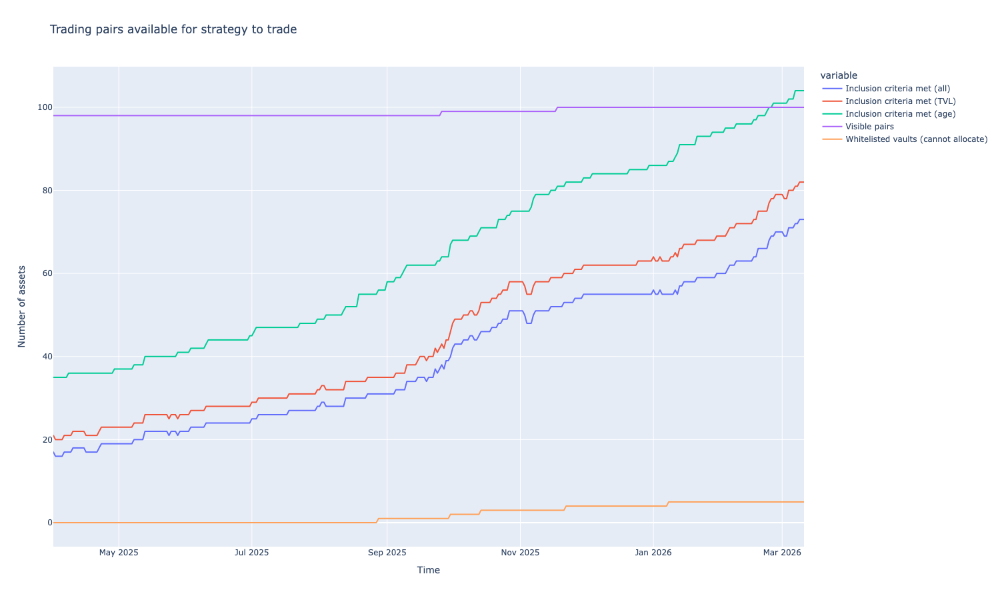

Head (5 rows)


,Inclusion criteria met (all),Inclusion criteria met (TVL),Inclusion criteria met (age),Visible pairs,Whitelisted vaults (cannot allocate)
2024-06-01,2,5,11,77,0
2024-06-02,3,6,12,77,0
2024-06-03,3,6,12,77,0
2024-06-04,3,6,12,77,0
2024-06-05,3,6,12,77,0


Tail (5 rows)


,Inclusion criteria met (all),Inclusion criteria met (TVL),Inclusion criteria met (age),Visible pairs,Whitelisted vaults (cannot allocate)
2026-03-07,72,81,104,100,5
2026-03-08,72,81,104,100,5
2026-03-09,73,82,104,100,5
2026-03-10,73,82,104,100,5
2026-03-11,73,82,104,100,5


In [9]:
indicator_data = calculate_and_load_indicators_inline(
    strategy_universe=strategy_universe,
    parameters=parameters,
    create_indicators=create_indicators,
    max_workers=1,
)

charts = create_charts(
    timestamp=None,
    parameters=parameters,
    strategy_universe=strategy_universe,
    execution_context=notebook_execution_context,
)
chart_renderer = ChartBacktestRenderingSetup(
    registry=charts,
    strategy_input_indicators=indicator_data,
    backtest_start_at=Parameters.backtest_start,
    backtest_end_at=Parameters.backtest_end,
)

fig, available_trading_pairs_df = chart_renderer.render(available_trading_pairs, with_dataframe=True)
fig.show()
display_head_and_tail(available_trading_pairs_df, head_rows=5, tail_rows=5)


## Backtest

Run the backtest and check the headline outcome.


In [10]:
result = run_backtest_inline(
    client=client,
    universe=strategy_universe,
    decide_trades=decide_trades,
    create_indicators=create_indicators,
    parameters=Parameters,
    initial_deposit=Parameters.initial_cash,
    reserve_currency=ReserveCurrency.usdc,
    trade_routing=Parameters.routing,
    engine_version=trading_strategy_engine_version,
    max_workers=1,
    name=Parameters.id,
)

state = result.state
indicator_data = result.indicators
trades = list(state.portfolio.get_all_trades())
bridge_trades = [trade for trade in trades if trade.pair.is_cctp_bridge()]
vault_trades = [trade for trade in trades if trade.pair.kind.is_vault()]
equity_curve = calculate_equity_curve(state)
returns = calculate_returns(equity_curve)
final_equity = state.portfolio.get_total_equity()
total_return = final_equity / Parameters.initial_cash - 1
satellite_vault_trades = [
    trade for trade in vault_trades
    if trade.pair.chain_id != Parameters.primary_chain_id.value
]

summary_df = pd.DataFrame(
    [
        ("Initial cash USD", Parameters.initial_cash),
        ("Final equity USD", final_equity),
        ("Total return", total_return),
        ("Equity curve points", len(equity_curve)),
        ("All trades", len(trades)),
        ("Vault trades", len(vault_trades)),
        ("CCTP bridge trades", len(bridge_trades)),
        ("Successful CCTP bridge trades", sum(trade.is_success() for trade in bridge_trades)),
        ("Satellite vault trades", len(satellite_vault_trades)),
    ],
    columns=["Metric", "Value"],
)

trade_chain_summary = pd.DataFrame(
    [
        (trade.pair.chain_id, trade.pair.kind.name, trade.get_value())
        for trade in trades
    ],
    columns=["Chain", "Kind", "Value USD"],
)
if not trade_chain_summary.empty:
    trade_chain_summary = (
        trade_chain_summary
        .groupby(["Chain", "Kind"], as_index=False)
        .agg(Trades=("Value USD", "size"), Total_value_usd=("Value USD", "sum"))
        .sort_values(["Chain", "Kind"])
    )

display(summary_df)
display(trade_chain_summary)

assert final_equity > Parameters.initial_cash, f"Expected profitable run, got final equity {final_equity:,.2f}"
assert all(trade.is_success() for trade in bridge_trades), "Expected all CCTP bridge trades to execute"

ignored_pair_ids = {pair.internal_id for pair in vault_pairs if pair.get_ignore_reason() is not None}
ignored_vault_trades = [trade for trade in vault_trades if trade.pair.internal_id in ignored_pair_ids]
assert not ignored_vault_trades, f"Expected no trades in ignored vaults, got {len(ignored_vault_trades)}"

2026-08-05 21:09:08,974 tradeexecutor.backtest.backtest_execution          WARNING  Fixing token sell amount to be within the epsilon. Wallet balance: 1940.596348819802586628674324, sell order quantity: -1940.59634881980264253797940909862518310546875, diff: 5.590930508509862518310546875E-14


,Metric,Value
0,Initial cash USD,100000.000000
1,Final equity USD,112503.909743
2,Total return,0.125039
3,Equity curve points,344.000000
4,All trades,3235.000000
5,Vault trades,2623.000000
6,CCTP bridge trades,612.000000
7,Successful CCTP bridge trades,612.000000
8,Satellite vault trades,1558.000000


,Chain,Kind,Trades,Total_value_usd
0,1,vault,1065,3.019022e+06
1,8453,cctp_bridge,233,1.133679e+06
2,8453,vault,976,2.770523e+06
3,42161,cctp_bridge,236,6.983109e+05
4,42161,vault,411,8.743927e+05
5,43114,cctp_bridge,143,4.703724e+05
6,43114,vault,171,4.902916e+05


In [11]:
chart_renderer = ChartBacktestRenderingSetup(
    registry=charts,
    strategy_input_indicators=indicator_data,
    state=state,
    backtest_start_at=Parameters.backtest_start,
    backtest_end_at=Parameters.backtest_end,
)


## Ignored vaults and missing fee data

Vaults retained in the universe as data-only pairs (`ignore_reason="lacks_fee_data"`): excluded
from the inclusion criteria, never entered by the alpha model, listed with their missing fee
fields and Trading Strategy links.


In [12]:
ignored_vault_table = chart_renderer.render(ignored_vault_data)
display(ignored_vault_table)


Name,Chain,Address,Curator,Protocol,Missing fees,Link


## Whitelisted vaults that cannot be allocated

The following vaults require depositor allow-list approval according to their published metadata. They are retained as data-only pairs for diagnostics and are excluded from portfolio allocation.


In [13]:
whitelisted_vault_table = render_whitelisted_vaults(strategy_universe)
display(whitelisted_vault_table)


Name,Protocol,Chain,Address
AltaETF,lagoon-finance,Ethereum,0x3be67ba2d3fec744d1d2b5d564c83f57372578e4
BL USDC WSR Loop,ipor-fusion,Ethereum,0x95b2ed8f821570f85fd0e3e6e7088c6296587088
Block4Block,lagoon-finance,Ethereum,0x9fdbaaa76194d56e49cade12c1f216f47d2b865e
Der USDC,lagoon-finance,Ethereum,0xf10801bcc3deaf467fb8b3dbb7430111822e6dab
Der base USDC,lagoon-finance,Ethereum,0xba6cfe8a9d199cd7f3e50114c4e4ec66f2d52c87
Muchacho USDC,lagoon-finance,Ethereum,0xef39d77c7fb6224ac974c5fa4e3151a6c6ce9594
Noon STS USDC,lagoon-finance,Ethereum,0xb993c32f578e5156369330787cf8c8fe033bf40e
Strada USDC,lagoon-finance,Ethereum,0xcb58582b0d52ce5feecb06ba9ce66598b0d57886
TESS USDC Ethena Loop Vault,ipor-fusion,Ethereum,0x888e1d3c509c80e24cab8a4872e164b7e5a6eb10
TESS USDC Lending Optimiser,ipor-fusion,Ethereum,0xc825779c89120eeef746c51130b362478e181d39


## Equity curve

Total portfolio equity through the backtest.


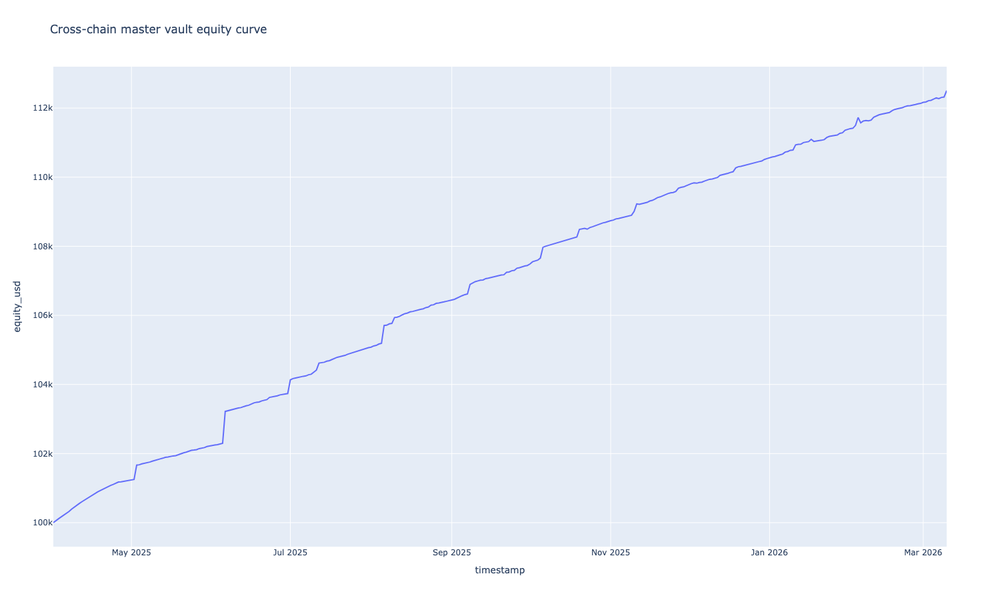

In [14]:
equity_df = equity_curve.rename("equity_usd").reset_index()
equity_df.columns = ["timestamp", "equity_usd"]
fig = px.line(equity_df, x="timestamp", y="equity_usd", title="Cross-chain master vault equity curve")
fig.show()

## Performance metrics

Standard performance metrics against BTC and ETH benchmarks.


In [15]:
performance_metrics_df = chart_renderer.render(performance_metrics)
display(performance_metrics_df)

,Strategy,BTC,ETH
Start Period,2025-04-01,2025-04-01,2025-04-01
End Period,2026-03-10,2026-03-10,2026-03-10
Risk-Free Rate,0.0%,0.0%,0.0%
Time in Market,100.0%,100.0%,100.0%
Cumulative Return,12.5%,-18.31%,6.85%
CAGR﹪,13.36%,-19.36%,7.31%
Sharpe,9.44,-0.26,0.47
Prob. Sharpe Ratio,100.0%,39.96%,67.57%
Smart Sharpe,9.08,-0.25,0.45
Sortino,79.03,-0.37,0.72


## Asset weight chart

How portfolio allocation moved across vault assets during the backtest.


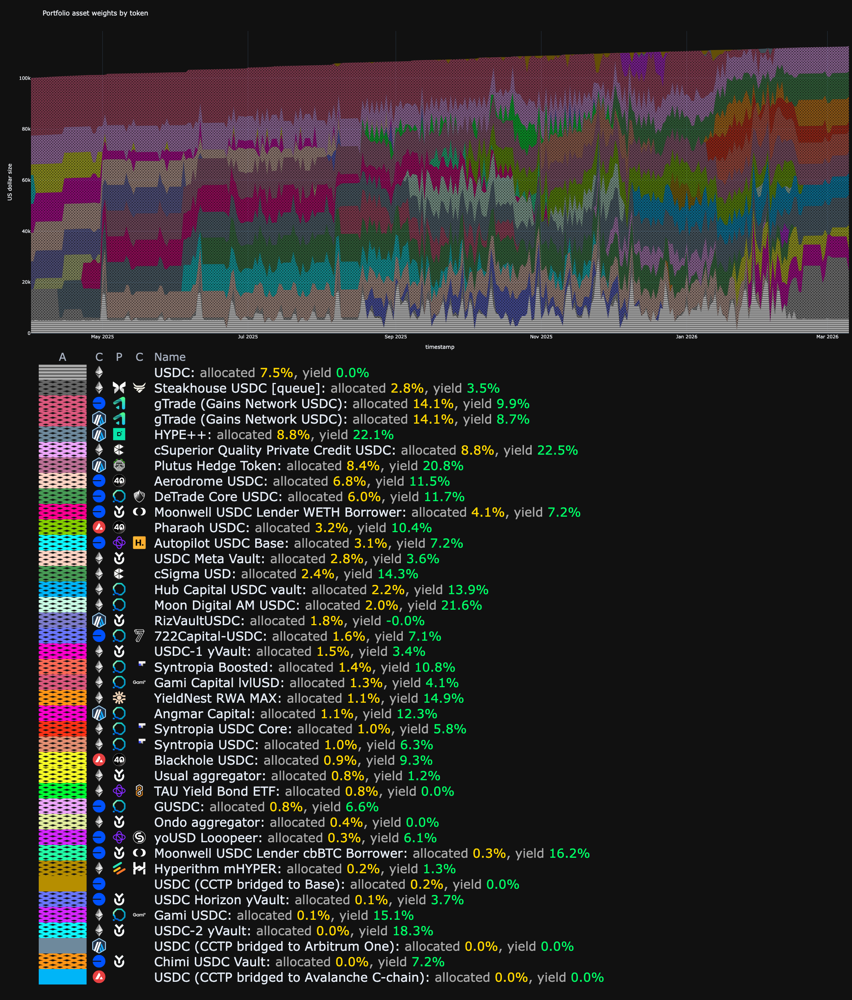

In [16]:
token_weights_fig = chart_renderer.render(equity_curve_by_asset_with_legend)
token_weights_fig.show(width=token_weights_fig.layout.width, height=token_weights_fig.layout.height)


## Chain weight chart

USD allocation per chain over time, with the queue venue as its own band.


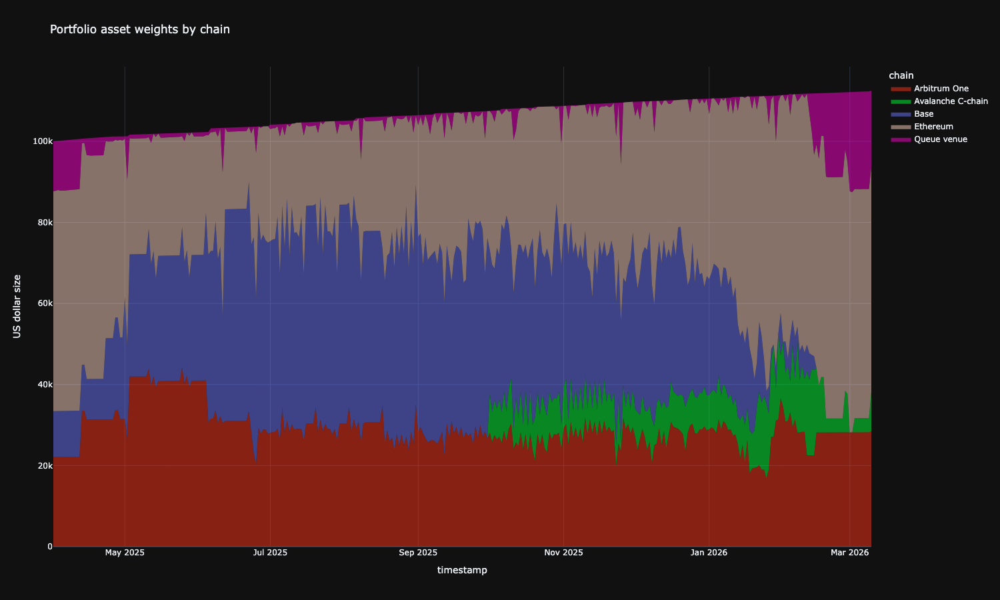

Head (10 rows)


chain,Arbitrum One,Avalanche C-chain,Base,Ethereum,Queue venue
timestamp,,,,,
2025-04-01,22151.721888,0.0,11279.879999,54287.518113,12280.880000
2025-04-02,22154.202094,0.0,11283.481483,54342.807967,12281.517284
2025-04-03,22157.787818,0.0,11288.915118,54567.359021,12099.849733
2025-04-04,22159.960401,0.0,11293.228523,54387.646769,12326.122078
2025-04-05,22163.017399,0.0,11298.337606,54364.504864,12392.809325
2025-04-06,22164.103691,0.0,11300.494308,54408.877405,12393.991692
2025-04-07,22171.150167,0.0,11304.127201,54388.987753,12458.984087
2025-04-08,22189.107626,0.0,11311.162658,54431.337920,12460.010984
2025-04-09,22195.202396,0.0,11317.213990,54465.479745,12473.570209


Tail (10 rows)


chain,Arbitrum One,Avalanche C-chain,Base,Ethereum,Queue venue
timestamp,,,,,
2026-03-01,28223.435740,3.921887e-07,0.0,59424.086444,24517.817061
2026-03-02,28223.435740,0.000000e+00,0.0,59243.223726,24708.926267
2026-03-03,28223.435740,3.469459e+03,0.0,56541.228608,23978.150186
2026-03-04,28223.435740,3.470208e+03,0.0,56495.607081,24036.069833
2026-03-05,28223.435740,3.470954e+03,0.0,56527.178618,24037.959638
2026-03-06,28247.064939,3.471755e+03,0.0,56534.607972,24039.677643
2026-03-07,28247.064939,3.472491e+03,0.0,56513.925649,24041.610399
2026-03-08,28247.064939,3.473285e+03,0.0,56544.708593,24043.908230
2026-03-09,28247.064939,3.474105e+03,0.0,56542.460484,24055.292911


In [17]:
chain_weights_fig, chain_weights_df = chart_renderer.render(equity_curve_by_chain)
chain_weights_fig.update_layout(title="Portfolio asset weights by chain")
chain_weights_fig.show()
display_head_and_tail(chain_weights_df, head_rows=10, tail_rows=10)

## Pending settlements chart

Capital pending in async vault settlements and the phase-aware trigger queue.


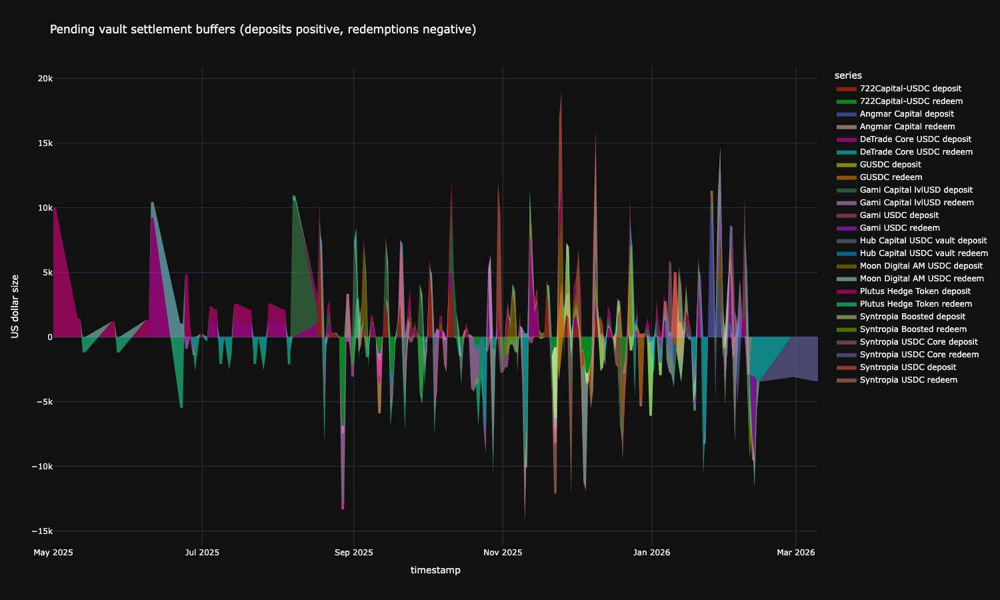

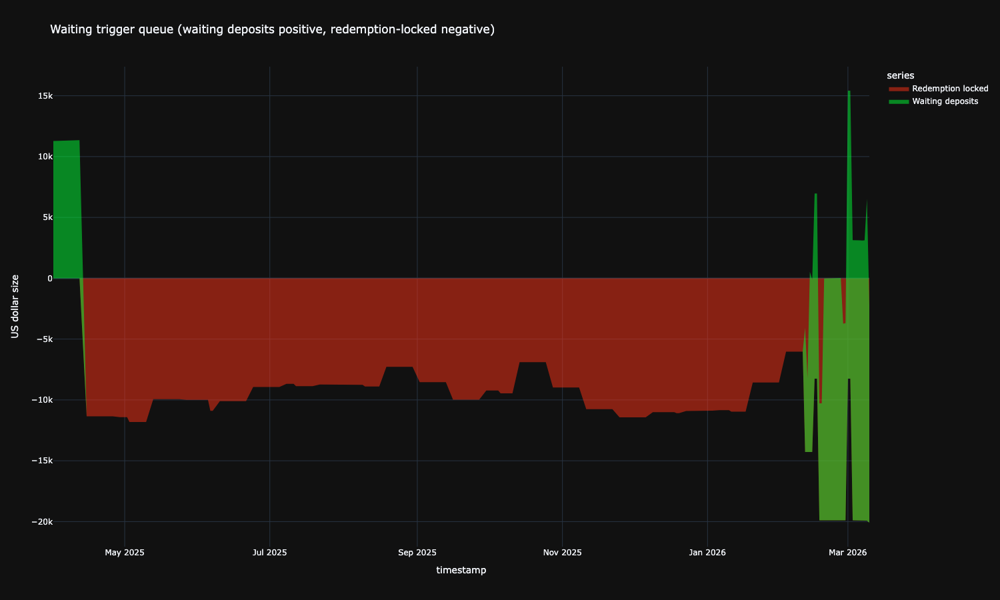

Head (5 rows)


series,Redemption locked,Waiting deposits
timestamp,,
2025-04-01,0.0,11279.880000
2025-04-02,0.0,11286.949006
2025-04-03,0.0,11292.865933
2025-04-04,0.0,11298.913186
2025-04-05,0.0,11304.808288


Tail (5 rows)


series,Redemption locked,Waiting deposits
timestamp,,
2026-03-06,-19920.700492,23042.451823
2026-03-07,-19920.700492,23019.138004
2026-03-08,-19920.700492,23038.446812
2026-03-09,-19920.700492,26468.887026
2026-03-10,-20088.120869,17822.712790


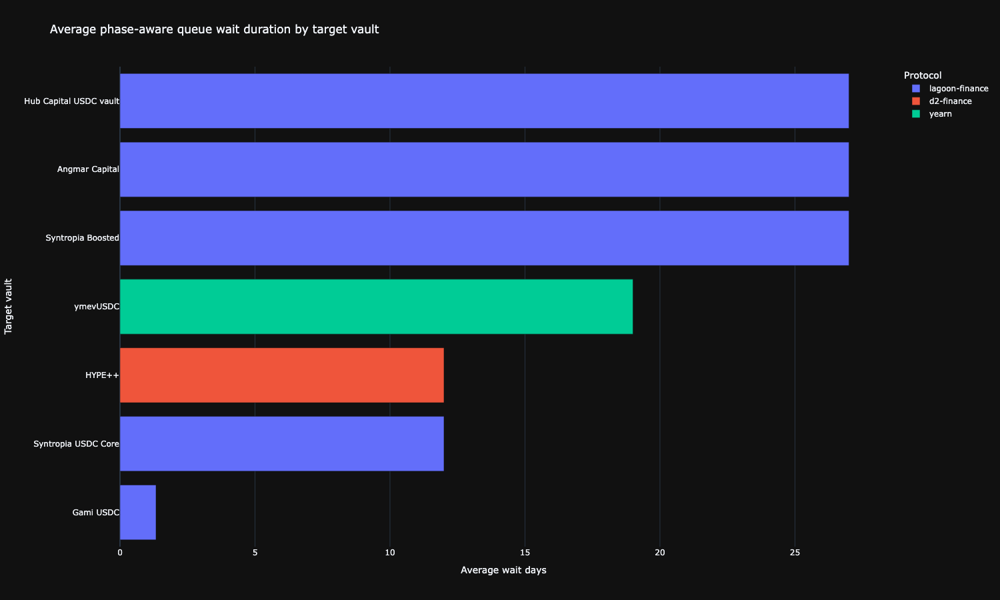

,Vault id,Vault,Ticker,Protocol,Chain,Episodes,Promoted,Closed,Open,Average wait days,Median wait days,Max wait days,Average start USD,Max queued USD,USD days
0,281651290,ymevUSDC,ymevUSDC-USDC,yearn,43114,1,0,0,1,19.000000,19.0,19.0,10257.747831,11677.160860,197230.904669
1,272519172,HYPE++,HYPE++-USDC,d2-finance,42161,1,1,0,0,12.000000,12.0,12.0,11279.880000,11349.231029,135776.418406
2,279865189,Syntropia USDC Core,synUSD-USDC,lagoon-finance,1,2,0,2,0,12.000000,12.0,16.0,2918.489105,6867.853350,107781.833029
3,284178133,Syntropia Boosted,synUSDx-USDC,lagoon-finance,1,1,0,0,1,27.000000,27.0,27.0,2108.204009,3376.690341,57975.143699
4,269961806,Angmar Capital,AngmarUSD-USDC,lagoon-finance,42161,1,0,0,1,27.000000,27.0,27.0,2122.692927,3367.647003,57784.913741
5,281923541,Hub Capital USDC vault,HubCap-USDC-USDC,lagoon-finance,1,1,0,0,1,27.000000,27.0,27.0,2102.130380,3366.251790,57311.760215
6,270155334,Gami USDC,gamiusdc-USDC,lagoon-finance,1,3,0,2,1,1.333333,1.0,2.0,5669.787458,10293.753248,20509.328909


,Vault id,Vault,Ticker,Protocol,Chain,Episodes,Promoted,Closed,Open,Average wait days,Median wait days,Max wait days,Average start USD,Max queued USD,USD days
0,281651290,ymevUSDC,ymevUSDC-USDC,yearn,43114,1,0,0,1,19.000000,19.0,19.0,10257.747831,11677.160860,197230.904669
1,272519172,HYPE++,HYPE++-USDC,d2-finance,42161,1,1,0,0,12.000000,12.0,12.0,11279.880000,11349.231029,135776.418406
2,279865189,Syntropia USDC Core,synUSD-USDC,lagoon-finance,1,2,0,2,0,12.000000,12.0,16.0,2918.489105,6867.853350,107781.833029
3,284178133,Syntropia Boosted,synUSDx-USDC,lagoon-finance,1,1,0,0,1,27.000000,27.0,27.0,2108.204009,3376.690341,57975.143699
4,269961806,Angmar Capital,AngmarUSD-USDC,lagoon-finance,42161,1,0,0,1,27.000000,27.0,27.0,2122.692927,3367.647003,57784.913741
5,281923541,Hub Capital USDC vault,HubCap-USDC-USDC,lagoon-finance,1,1,0,0,1,27.000000,27.0,27.0,2102.130380,3366.251790,57311.760215
6,270155334,Gami USDC,gamiusdc-USDC,lagoon-finance,1,3,0,2,1,1.333333,1.0,2.0,5669.787458,10293.753248,20509.328909


In [18]:
settlement_fig, settlement_df = chart_renderer.render(pending_vault_settlements)
settlement_fig.show()

trigger_fig, trigger_df = chart_renderer.render(pending_trigger_queue)
trigger_fig.show()
if not trigger_df.empty:
    display_head_and_tail(trigger_df, head_rows=5, tail_rows=5)
queue_duration_fig, queue_duration_df = chart_renderer.render(phase_aware_queue_duration)
queue_duration_fig.show()
if not queue_duration_df.empty:
    display(queue_duration_df)

queue_duration_summary_df = chart_renderer.render(phase_aware_queue_duration_summary)
if not queue_duration_summary_df.empty:
    display(queue_duration_summary_df)
